In [ ]:
!pip install ultralytics

In [ ]:
import os
import cv2
import yaml
import shutil
import numpy as np
import matplotlib.pyplot as plt
import torch
import easyocr
from ultralytics import YOLO


reader = easyocr.Reader(['en'])


print("CUDA Available:", torch.cuda.is_available())

In [ ]:
def list_directory_tree_with_os_walk(starting_directory):
    for root, directories, files in os.walk(starting_directory):
        print(f"Directory: {root}")

list_directory_tree_with_os_walk('/kaggle/input/large-license-plate-dataset')


In [ ]:


src_base = '/kaggle/input/large-license-plate-dataset'
dst_base = '/kaggle/working/dataset'


folders = [
    ('images/train', 'train/images'),
    ('labels/train', 'train/labels'),
    ('images/val', 'validation/images'),
    ('labels/val', 'validation/labels'),
    ('images/test', 'test/images'),
    ('labels/test', 'test/labels')
]


for src_folder, dst_folder in folders:
    src_path = os.path.join(src_base, src_folder)
    dst_path = os.path.join(dst_base, dst_folder)
    
   
    if os.path.exists(dst_path):
        shutil.rmtree(dst_path)
    
 
    shutil.copytree(src_path, dst_path)
    print(f"Copied {src_folder} to {dst_folder}")



training_config = {"path": "/kaggle/working/dataset", "train":"train/images", "val": "validation/images", "test": "test/images", "names": {0: "license_plate"}}
with open('data.yaml', 'w') as yaml_file:
    yaml.dump(training_config, yaml_file, sort_keys=False)

In [ ]:
IMG_DATA = "/kaggle/working/dataset/{mode}/images"
LABEL_DATA = "/kaggle/working/dataset/{mode}/labels"

def preprocess_bbox(line: str, img_h: int, img_w: int) -> list[int]:
    
    class_id, x_c, y_c, w, h = map(float, line.strip().split())
    x1 = int((x_c - w / 2) * img_w)
    y1 = int((y_c - h / 2) * img_h)
    x2 = int((x_c + w / 2) * img_w)
    y2 = int((y_c + h / 2) * img_h)
    return [x1, y1, x2, y2]

def plot_labeled_data(mode: str = 'train'):
    rows, cols = 4, 4
    fig = plt.figure(figsize=(20, 20))

    img_dir = IMG_DATA.format(mode=mode)
    lbl_dir = LABEL_DATA.format(mode=mode)
    img_files = os.listdir(img_dir)[: rows * cols]

    for idx, img_name in enumerate(img_files):
    
        img_path = os.path.join(img_dir, img_name)
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img_h, img_w = img.shape[:2]

  
        label_path = os.path.join(lbl_dir, f"{os.path.splitext(img_name)[0]}.txt")
        with open(label_path, 'r') as f:
            for line in f:
                x1, y1, x2, y2 = preprocess_bbox(line, img_h, img_w)
                cv2.rectangle(img, (x1, y1), (x2, y2), (255, 0, 155), 2)

    
        ax = fig.add_subplot(rows, cols, idx + 1)
        ax.imshow(img)
        ax.axis('off')

    plt.tight_layout()
    plt.show()

if __name__ == "__main__":
    plot_labeled_data()


In [ ]:
plot_labeled_data(mode='train')

In [ ]:
plot_labeled_data(mode='test')

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from easyocr import Reader

IMG_DIR   = "/kaggle/working/dataset/{mode}/images"
LABEL_DIR = "/kaggle/working/dataset/{mode}/labels"

reader = Reader(['en'], gpu=False)

def preprocess_bbox(line: str, img_h: int, img_w: int) -> list[int]:
    _, x_c, y_c, w, h = map(float, line.strip().split())
    x1 = int((x_c - w/2) * img_w)
    y1 = int((y_c - h/2) * img_h)
    x2 = int((x_c + w/2) * img_w)
    y2 = int((y_c + h/2) * img_h)
    return [x1, y1, x2, y2]

def preprocess_image(img: np.ndarray):
    gray    = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    blurred = cv2.GaussianBlur(gray, (5,5), 0)
    _, binary = cv2.threshold(
        blurred, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU
    )
    sx = cv2.Sobel(binary, cv2.CV_64F, 1, 0, ksize=3)
    sy = cv2.Sobel(binary, cv2.CV_64F, 0, 1, ksize=3)
    edges = cv2.magnitude(sx, sy)
    kernel = np.ones((5,5), np.uint8)
    closed = cv2.morphologyEx(edges, cv2.MORPH_CLOSE, kernel)
    contours, _ = cv2.findContours(
        closed.astype(np.uint8),
        cv2.RETR_EXTERNAL,
        cv2.CHAIN_APPROX_SIMPLE
    )
    top_ctrs = sorted(contours, key=cv2.contourArea, reverse=True)[:30]
    return gray, blurred, binary, edges, closed, top_ctrs

def extract_text_from_contours(img: np.ndarray, contours: list) -> list[str]:
    texts = []
    for ctr in contours:
        x, y, w, h = cv2.boundingRect(ctr)
        roi = img[y:y+h, x:x+w]
        for _, txt, _ in reader.readtext(roi):
            texts.append(txt)
    return texts

def plot_labeled_data(mode: str = 'train'):
    img_dir = IMG_DIR.format(mode=mode)
    lbl_dir = LABEL_DIR.format(mode=mode)
    files   = os.listdir(img_dir)[:16]

    for fname in files:
      
        img_path = os.path.join(img_dir, fname)
        img = cv2.imread(img_path)
        h, w = img.shape[:2]

        label_path = os.path.join(lbl_dir, f"{os.path.splitext(fname)[0]}.txt")
        with open(label_path, 'r') as f:
            for line in f:
                x1, y1, x2, y2 = preprocess_bbox(line, h, w)
                cv2.rectangle(img, (x1, y1), (x2, y2), (255, 0, 155), 2)

       
        gray, blurred, binary, edges, closed, ctrs = preprocess_image(img)
        ocr_texts = extract_text_from_contours(img, ctrs)

   
        fig, axes = plt.subplots(3, 3, figsize=(15,15))
        ax = axes.flatten()

        ax[0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        ax[0].set_title("Labeled Image")

        ax[1].imshow(gray, cmap='gray');    ax[1].set_title("Grayscale")
        ax[2].imshow(blurred, cmap='gray'); ax[2].set_title("Gaussian Blur")
        ax[3].imshow(binary, cmap='gray');  ax[3].set_title("Binarized")
        ax[4].imshow(edges, cmap='gray');   ax[4].set_title("Edges")
        ax[5].imshow(closed, cmap='gray');  ax[5].set_title("Closed Edges")

        cont_img = cv2.drawContours(img.copy(), ctrs, -1, (0,255,0), 2)
        ax[6].imshow(cv2.cvtColor(cont_img, cv2.COLOR_BGR2RGB))
        ax[6].set_title("Top Contours")

       
        ax[7].axis('off')

        
        ax[8].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        ax[8].set_title(f"Extracted Text: {', '.join(ocr_texts)}")

        for a in ax:
            a.axis('off')
        plt.tight_layout()
        plt.show()

if __name__ == "__main__":
    plot_labeled_data()


In [ ]:
plot_labeled_data(mode='train')

In [ ]:
plot_labeled_data(mode='test')

In [ ]:
from ultralytics import YOLO
model = YOLO('yolov8n.pt')
model.train(data='/kaggle/working/data.yaml', epochs=20, imgsz=640)

In [ ]:
import pandas as pd

df = pd.read_csv('/kaggle/working/runs/detect/train/results.csv')
print(df.columns.tolist())

In [ ]:
def print_yolo_training_summary(results_csv_path):
    if not os.path.exists(results_csv_path):
        print("results.csv not found!")
        return

    df = pd.read_csv(results_csv_path)

    for i, row in df.iterrows():
        print(f"Epoch {i+1}/{len(df)}")
        print(f" ━ train/box_loss: {row['train/box_loss']:.4f} | train/cls_loss: {row['train/cls_loss']:.4f} | train/dfl_loss: {row['train/dfl_loss']:.4f}")
        print(f" ━ val/box_loss:   {row['val/box_loss']:.4f} | val/cls_loss:   {row['val/cls_loss']:.4f} | val/dfl_loss:   {row['val/dfl_loss']:.4f}")
        print(f" ━ precision: {row['metrics/precision(B)']:.4f} | recall: {row['metrics/recall(B)']:.4f} | mAP50: {row['metrics/mAP50(B)']:.4f}")
        print("-" * 80)

In [ ]:
print_yolo_training_summary('/kaggle/working/runs/detect/train/results.csv')


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt


csv_path = '/kaggle/working/runs/detect/train/results.csv'
df = pd.read_csv(csv_path)

In [ ]:
def plot_loss_curves(df):
    plt.figure(figsize=(12, 5))
    plt.plot(df['train/box_loss'], label='Train Box Loss')
    plt.plot(df['train/cls_loss'], label='Train Cls Loss')
    plt.plot(df['train/dfl_loss'], label='Train DFL Loss')
    plt.plot(df['val/box_loss'], '--', label='Val Box Loss')
    plt.plot(df['val/cls_loss'], '--', label='Val Cls Loss')
    plt.plot(df['val/dfl_loss'], '--', label='Val DFL Loss')
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title("YOLOv8 Training & Validation Loss")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


In [ ]:
def plot_metric(df, column_name, title, ylabel, filename):
    plt.figure(figsize=(8, 4))
    plt.plot(df[column_name], marker='o')
    plt.title(title)
    plt.xlabel('Epoch')
    plt.ylabel(ylabel)
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(f'/kaggle/working/{filename}.png')
    plt.show()


In [ ]:
plot_metric(df, 'metrics/precision(B)', 'Precision Over Epochs', 'Precision', 'precision_plot')
plot_metric(df, 'metrics/recall(B)', 'Recall Over Epochs', 'Recall', 'recall_plot')
plot_metric(df, 'metrics/mAP50(B)', 'mAP@0.5 Over Epochs', 'mAP@0.5', 'map50_plot')
plot_metric(df, 'metrics/mAP50-95(B)', 'mAP@0.5:0.95 Over Epochs', 'mAP@0.5:0.95', 'map50_95_plot')


In [ ]:
def plot_metrics(df):
    plt.figure(figsize=(12, 5))
    plt.plot(df['metrics/precision(B)'], label='Precision')
    plt.plot(df['metrics/recall(B)'], label='Recall')
    plt.plot(df['metrics/mAP50(B)'], label='mAP@0.5')
    plt.plot(df['metrics/mAP50-95(B)'], label='mAP@0.5:0.95')
    plt.xlabel("Epoch")
    plt.ylabel("Score")
    plt.title("YOLOv8 Validation Metrics")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


In [ ]:
plot_loss_curves(df)
plot_metrics(df)


In [ ]:
last_epoch = df.iloc[-1]  # last row

print(f" Final Precision     : {last_epoch['metrics/precision(B)']:.4f}")
print(f" Final Recall        : {last_epoch['metrics/recall(B)']:.4f}")
print(f" Final mAP@0.5       : {last_epoch['metrics/mAP50(B)']:.4f}")
print(f" Final mAP@0.5:0.95  : {last_epoch['metrics/mAP50-95(B)']:.4f}")


Using trained model: /kaggle/working/runs/detect/train/weights/best.pt
 Testing on random samples from dataset...

 Processing: 52bf6b555e578a34.jpg

0: 448x640 1 license_plate, 7.5ms
Speed: 2.5ms preprocess, 7.5ms inference, 2.5ms postprocess per image at shape (1, 3, 448, 640)
Top OCR candidates: [('1801C', '1801C', 0.9872682314329313, 'bilateral_ang0'), ('1801C', '1801C', 0.9872682314329313, 'bilateral_ang0'), ('1801', '1801', 0.9656339883804321, 'otsu_orig_ang-2')]


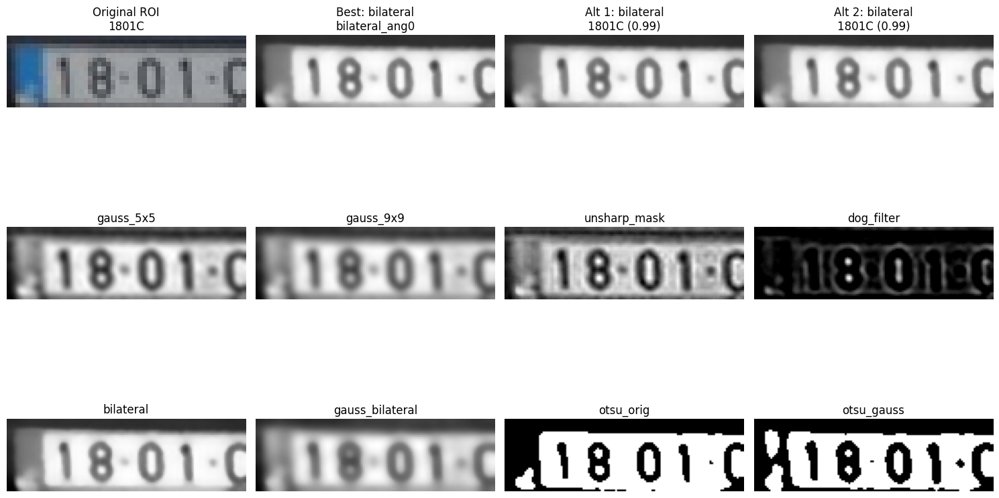

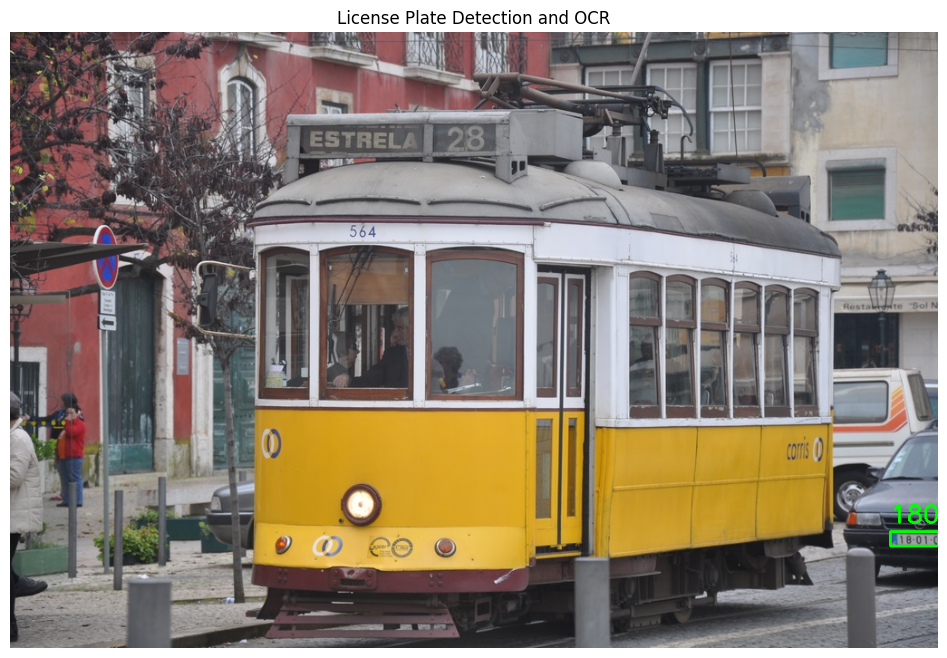

Plate #1:
   Cleaned Text: 1801C
   OCR Confidence: 0.99
   Best Process: bilateral_ang0
   Alternative results:
     Alt 1: 1801C (Conf: 0.99, Method: bilateral_ang0)
     Alt 2: 1801C (Conf: 0.99, Method: bilateral_ang0)
     Alt 3: 1801 (Conf: 0.97, Method: otsu_orig_ang-2)

 Processing: 0801961485534636.jpg

0: 480x640 1 license_plate, 7.3ms
Speed: 2.5ms preprocess, 7.3ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)
Top OCR candidates: [('6AUM641', '6AUM641', 0.97040841448541, 'pil_sharp_ang-2'), ('6AUM641', '6AUM641', 0.97040841448541, 'pil_sharp_ang-2'), ('6AUM6L1', '6AUM6L1', 0.9464183174842629, 'unsharp_mask_ang-2')]


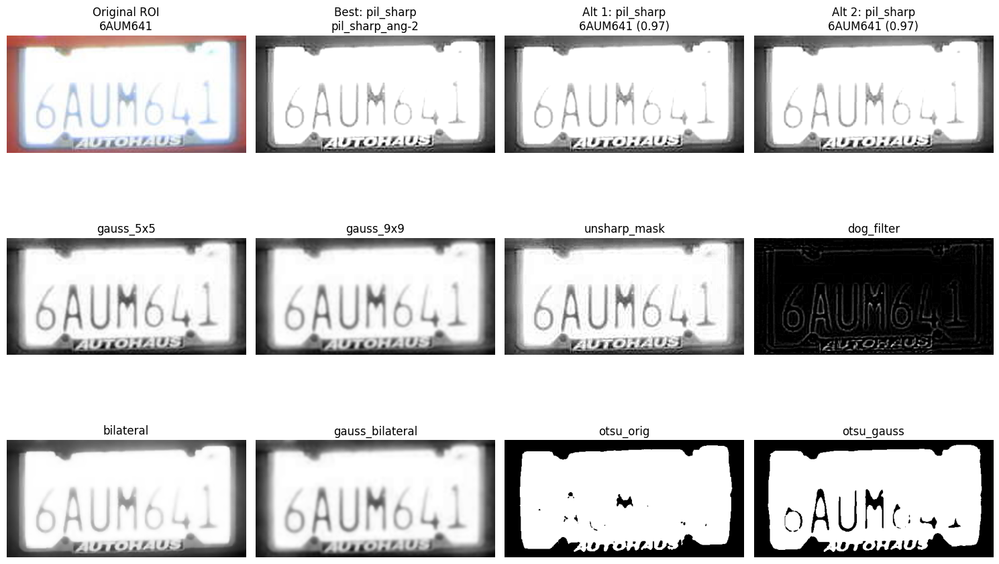

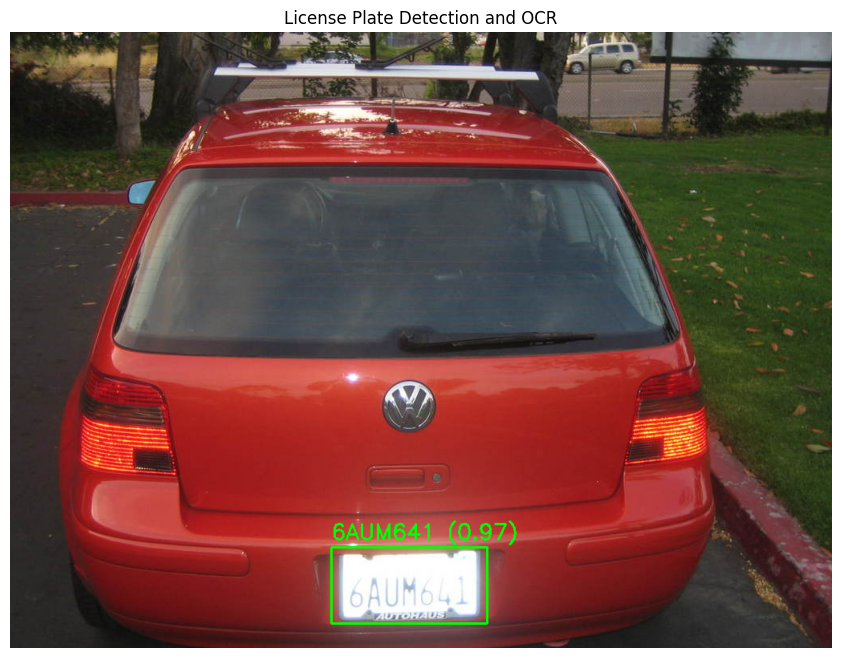

Plate #1:
   Cleaned Text: 6AUM641
   OCR Confidence: 0.97
   Best Process: pil_sharp_ang-2
   Alternative results:
     Alt 1: 6AUM641 (Conf: 0.97, Method: pil_sharp_ang-2)
     Alt 2: 6AUM641 (Conf: 0.97, Method: pil_sharp_ang-2)
     Alt 3: 6AUM6L1 (Conf: 0.95, Method: unsharp_mask_ang-2)

 Processing: 5fb888d79b551331.jpg

0: 640x640 1 license_plate, 7.4ms
Speed: 3.5ms preprocess, 7.4ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)
Top OCR candidates: [('INTHGLFT0', 'INTHGLFT0', 0.9374649725379891, 'otsu_orig_ang2'), ('INTHGLFT0', 'INTHGLFT0', 0.9374649725379891, 'otsu_orig_ang2'), ('NTHGLFTOCTUG', 'NTHGLFTOCTUG', 0.7546963007811467, 'gauss_9x9_ang-2')]


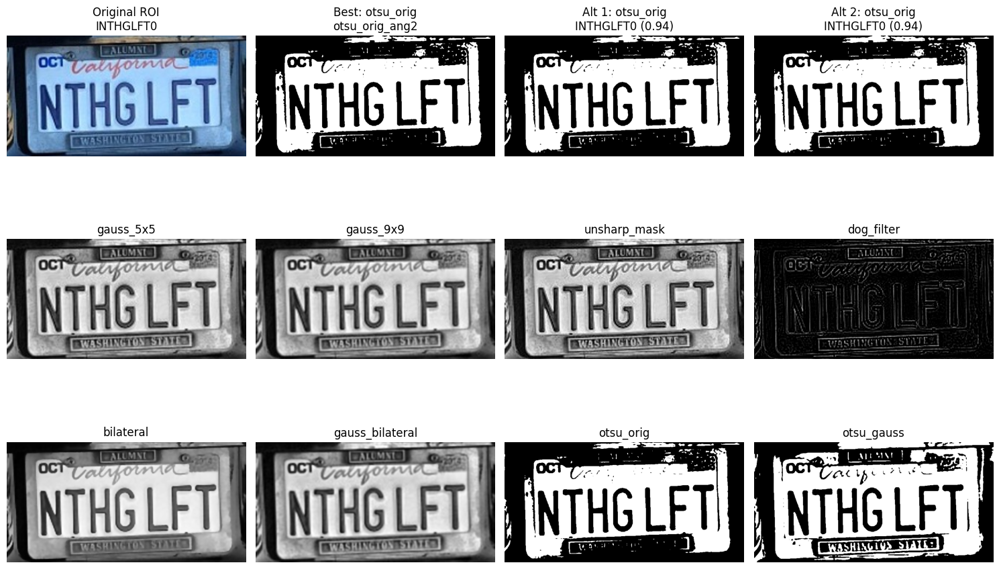

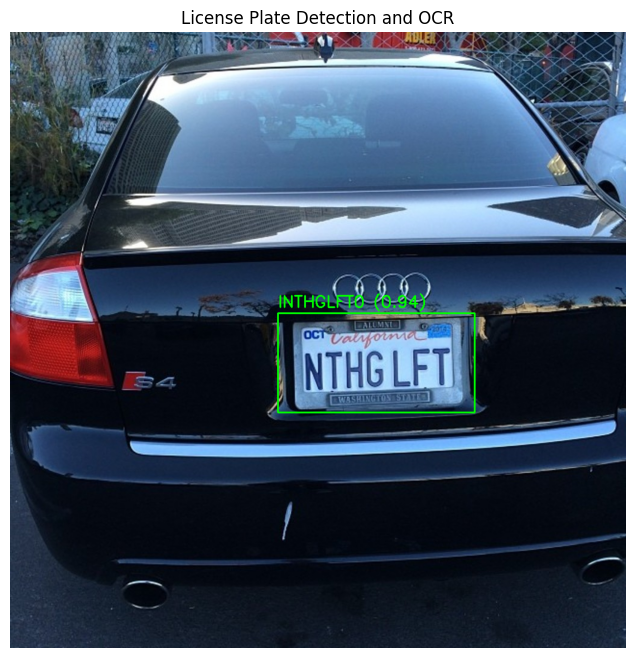

Plate #1:
   Cleaned Text: INTHGLFT0
   OCR Confidence: 0.94
   Best Process: otsu_orig_ang2
   Alternative results:
     Alt 1: INTHGLFT0 (Conf: 0.94, Method: otsu_orig_ang2)
     Alt 2: INTHGLFT0 (Conf: 0.94, Method: otsu_orig_ang2)
     Alt 3: NTHGLFTOCTUG (Conf: 0.75, Method: gauss_9x9_ang-2)


In [168]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import torch
from ultralytics import YOLO
import easyocr
import re
import random
from PIL import Image, ImageFilter, ImageEnhance


def get_model_path():
    custom_model_path = '/kaggle/working/runs/detect/train/weights/best.pt'
    if os.path.exists(custom_model_path):
        print(f"Using trained model: {custom_model_path}")
        return custom_model_path
    print("Trained model not found. Using pretrained YOLOv8n model.")
    return 'yolov8n.pt'

model_path = get_model_path()
model = YOLO(model_path)


reader = easyocr.Reader(['en'], gpu=torch.cuda.is_available(), 
                       model_storage_directory='/kaggle/working/easyocr',
                       recog_network='english_g2')


def clean_license_plate_text(text):
    if not text:
        return ""
    
  
    char_corrections = { 'O': 'O', 'Q': 'Q', 'D': 'D',  'I': 'I', 'L': 'L','Z': 'Z',                      
        'S': 'S','G': 'G','T': 'T','B': 'B',  }
    
  
    cleaned = re.sub(r'[^A-Z0-9]', '', text.upper())
    
    
    corrected = ""
    for i, char in enumerate(cleaned):
        
        if i < 3 and char.isdigit() and char in '01258':
           
            digit_to_letter = {'0': '0', '1': '1', '2': '2', '5': '5', '8': '8'}
            corrected += digit_to_letter.get(char, char)
        
        elif i >= 3 and char in char_corrections:
            corrected += char_corrections[char]
        else:
            corrected += char
    
    
    if len(corrected) < 4 or len(corrected) > 12:
        return ""
    
    return corrected


def preprocess_license_plate(roi):
    
    roi = cv2.resize(roi, None, fx=2.5, fy=2.5, interpolation=cv2.INTER_CUBIC)
    gray = cv2.cvtColor(roi, cv2.COLOR_BGR2GRAY)
    preprocessed_images = [("gray", gray)]
    
   
    hist_eq = cv2.equalizeHist(gray)
    preprocessed_images.append(("hist_eq", hist_eq))
    
    
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8)).apply(gray)
    preprocessed_images.append(("clahe", clahe))
    
   
    gauss1 = cv2.GaussianBlur(clahe, (5, 5), 0)
    preprocessed_images.append(("gauss_5x5", gauss1))
    
    
    gauss2 = cv2.GaussianBlur(clahe, (9, 9), 0)
    preprocessed_images.append(("gauss_9x9", gauss2))
    
    
    gauss3 = cv2.GaussianBlur(clahe, (7, 7), 2.0)
    unsharp_mask = cv2.addWeighted(clahe, 1.5, gauss3, -0.5, 0)
    preprocessed_images.append(("unsharp_mask", unsharp_mask))
    
  
    gauss_small = cv2.GaussianBlur(clahe, (5, 5), 1.0)
    gauss_large = cv2.GaussianBlur(clahe, (9, 9), 2.0)
    dog = cv2.subtract(gauss_small, gauss_large)
   
    dog = cv2.normalize(dog, None, 0, 255, cv2.NORM_MINMAX, dtype=cv2.CV_8U)
    preprocessed_images.append(("dog_filter", dog))
    
   
    bilateral = cv2.bilateralFilter(gray, 11, 17, 17)
    preprocessed_images.append(("bilateral", bilateral))
    
   
    gauss_bilateral = cv2.bilateralFilter(gauss1, 9, 75, 75)
    preprocessed_images.append(("gauss_bilateral", gauss_bilateral))
    
    
    _, otsu_orig = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    preprocessed_images.append(("otsu_orig", otsu_orig))
    
    _, otsu_gauss = cv2.threshold(gauss1, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    preprocessed_images.append(("otsu_gauss", otsu_gauss))
    
   
    adaptive = cv2.adaptiveThreshold(gauss1, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                     cv2.THRESH_BINARY, 11, 2)
    preprocessed_images.append(("adaptive", adaptive))
    
    adaptive_inv = cv2.adaptiveThreshold(gauss1, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                         cv2.THRESH_BINARY_INV, 11, 2)
    preprocessed_images.append(("adaptive_inv", adaptive_inv))
    

    kernel_sharpen = np.array([[-1,-1,-1], [-1,9,-1], [-1,-1,-1]])
    sharpened = cv2.filter2D(gauss1, -1, kernel_sharpen)
    preprocessed_images.append(("sharpened", sharpened))
    
    
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
    morph_gradient = cv2.morphologyEx(gauss1, cv2.MORPH_GRADIENT, kernel)
    preprocessed_images.append(("morph_gradient", morph_gradient))
    
   
    dilated = cv2.dilate(adaptive_inv, kernel, iterations=1)
    closed = cv2.erode(dilated, kernel, iterations=1)
    preprocessed_images.append(("morph_close", closed))
    
  
    canny = cv2.Canny(gauss1, 100, 200)
    preprocessed_images.append(("canny", canny))
    

    pil_img = Image.fromarray(gray)
    
 
    enhancer = ImageEnhance.Contrast(pil_img)
    pil_enhanced = enhancer.enhance(1.5)
    

    pil_sharpened = pil_enhanced.filter(ImageFilter.UnsharpMask(radius=2, percent=150))
    np_pil_sharp = np.array(pil_sharpened)
    preprocessed_images.append(("pil_sharp", np_pil_sharp))
    
    return preprocessed_images

def get_best_ocr_result(preprocessed_images, roi_original):
    best_conf, best_text, best_proc = 0, "", ""
    all_results = []
    
    # Now accept ANY alphanumeric string of length 4–12
    plate_patterns = [
        r'^[A-Z0-9]{4,12}$'
    ]
    
    # bidirectional corrections
    bi_map = {'0':'0','O':'O','1':'1','I':'I','2':'2','Z':'Z',
              '5':'5','S':'S','6':'6','G':'G','7':'7','T':'T','8':'8','B':'B'}
    def apply_bimap(s):
        return ''.join(bi_map.get(c,c) for c in s)
    
    for name, img in preprocessed_images:
        for angle in (0, -2, 2):
            # rotate if needed
            if angle:
                h,w = img.shape
                M = cv2.getRotationMatrix2D((w//2,h//2), angle, 1)
                img2 = cv2.warpAffine(img, M, (w,h),
                                      flags=cv2.INTER_CUBIC,
                                      borderMode=cv2.BORDER_REPLICATE)
            else:
                img2 = img

            for ocr_cfg in (
                {'allowlist':'ABCDEFGHIJKLMNOPQRSTUVWXYZ0123456789'},
                {'allowlist':'ABCDEFGHIJKLMNOPQRSTUVWXYZ0123456789',
                 'paragraph':False,'min_size':10,'width_ths':0.7}
            ):
                res = reader.readtext(img2, detail=1, **ocr_cfg)
                if not res:
                    continue

               
                res.sort(key=lambda r: r[0][0][0])
                joined = ''.join(r[1] for r in res)
                avg_conf = sum(r[2] for r in res)/len(res)
                
            
                cleaned = re.sub(r'[^A-Z0-9]', '', joined.upper())
                cleaned = apply_bimap(cleaned)
                
               
                if not re.match(plate_patterns[0], cleaned):
                    
                    adjusted_conf = avg_conf * 0.5    
                else:
                    adjusted_conf = avg_conf  

                desc = f"{name}_ang{angle}"
                all_results.append((joined, cleaned, adjusted_conf, desc))
                
                if adjusted_conf > best_conf:
                    best_conf, best_text, best_proc = adjusted_conf, cleaned, desc

   
    if best_conf < 0.4:
        pil = ImageEnhance.Contrast(Image.fromarray(cv2.cvtColor(roi_original, cv2.COLOR_BGR2RGB))).enhance(2.0)
        pil = pil.filter(ImageFilter.UnsharpMask(radius=2, percent=200))
        res = reader.readtext(np.array(pil), detail=1)
        if res:
            joined = ''.join(r[1] for r in res)
            cleaned = apply_bimap(re.sub(r'[^A-Z0-9]','', joined.upper()))
            avg_conf = sum(r[2] for r in res)/len(res)
            adjusted_conf = avg_conf
            best_conf, best_text, best_proc = adjusted_conf, cleaned, "fallback_pil"

    
    all_results = sorted(all_results, key=lambda x: x[2], reverse=True)[:3]
    print("Top OCR candidates:", all_results)
    return best_text, best_conf, best_proc, all_results



def detect_and_read_plates(image_path, show_preprocessing=False):
    image = cv2.imread(image_path)
    if image is None:
        print(f"Error: Cannot read image {image_path}")
        return
    
    
    img_h, img_w = image.shape[:2]
    
  
    smoothed = cv2.GaussianBlur(image, (5, 5), 0)
    
   
    filtered = cv2.bilateralFilter(smoothed, 9, 75, 75)
    
    
    vis_img = image.copy()
    
 
    results = model(filtered)[0]
    plate_results = []
    
    for box in results.boxes:
        x1, y1, x2, y2 = map(int, box.xyxy[0].tolist())
        
        h, w = y2-y1, x2-x1
        x1 = max(0, x1 - int(w * 0.05))
        y1 = max(0, y1 - int(h * 0.05))
        x2 = min(img_w, x2 + int(w * 0.05))
        y2 = min(img_h, y2 + int(h * 0.05))
        
        roi = image[y1:y2, x1:x2]
        if roi.size == 0:
            continue
        
      
        original_roi = roi.copy()
        
 
        preprocessed = preprocess_license_plate(roi)
        
       
        clean_text, ocr_conf, process_used, top_results = get_best_ocr_result(preprocessed, original_roi)
        
        plate_results.append({
            'bbox': (x1, y1, x2, y2),
            'clean_text': clean_text,
            'ocr_conf': ocr_conf,
            'process': process_used,
            'top_results': top_results
        })

       
        border_color = (0, 255, 0) if ocr_conf > 0.45 else (0, 165, 255)
        cv2.rectangle(vis_img, (x1, y1), (x2, y2), border_color, 2)
        
        
        conf_text = f"{clean_text} ({ocr_conf:.2f})"
        cv2.putText(vis_img, conf_text, (x1, y1-10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, border_color, 2)
        
       
        if show_preprocessing:
            plt.figure(figsize=(15, 10))
            plt.subplot(3, 4, 1)
            plt.imshow(cv2.cvtColor(original_roi, cv2.COLOR_BGR2RGB))
            plt.title(f"Original ROI\n{clean_text}")
            plt.axis('off')

            
            best_method_name = process_used.split('_')[0]
            
            
            shown = 2
            for name, img in preprocessed:
                if best_method_name in name and shown == 2:
                    plt.subplot(3, 4, shown)
                    plt.imshow(img, cmap='gray')
                    plt.title(f"Best: {name}\n{process_used}")
                    plt.axis('off')
                    shown += 1
                    break
            
          
            for i, (raw, clean, conf, method) in enumerate(top_results):
                if shown <= 4 and i < 3:  # Display up to 3 alternatives
                    plt.subplot(3, 4, shown)
                   
                    for name, img in preprocessed:
                        if name in method:
                            plt.imshow(img, cmap='gray')
                            plt.title(f"Alt {i+1}: {name}\n{clean} ({conf:.2f})")
                            plt.axis('off')
                            shown += 1
                            break
            
         
            for name, img in preprocessed:
                if shown <= 12 and name not in [p[0] for p in preprocessed[:shown-2]]:
                    plt.subplot(3, 4, shown)
                    plt.imshow(img, cmap='gray')
                    plt.title(name)
                    plt.axis('off')
                    shown += 1
                    if shown > 12:
                        break
                        
            plt.tight_layout()
            plt.show()

   
    plt.figure(figsize=(12, 8))
    plt.imshow(cv2.cvtColor(vis_img, cv2.COLOR_BGR2RGB))
    plt.title("License Plate Detection and OCR")
    plt.axis('off')
    plt.show()

    return plate_results


def verify_dataset_paths():
    base_path = '/kaggle/working/dataset'
    if not os.path.exists(base_path):
        base_path = '/kaggle/input/large-license-plate-dataset'

    test_dir = os.path.join(base_path, 'test/images')
    if not os.path.exists(test_dir):
        test_dir = os.path.join(base_path, 'images/test')

    return test_dir if os.path.exists(test_dir) else None

def test_on_random_samples(test_dir, num_samples=3):
    if not test_dir or not os.path.exists(test_dir):
        print("Error: Test directory not found")
        return

    test_imgs = os.listdir(test_dir)
    if not test_imgs:
        print("No images found.")
        return

    for _ in range(num_samples):
        img_path = os.path.join(test_dir, random.choice(test_imgs))
        print(f"\n Processing: {os.path.basename(img_path)}")
        results = detect_and_read_plates(img_path, show_preprocessing=True)
        if results:
            for i, res in enumerate(results):
                print(f"Plate #{i+1}:")
                print(f"   Cleaned Text: {res['clean_text']}")
                print(f"   OCR Confidence: {res['ocr_conf']:.2f}")
                print(f"   Best Process: {res['process']}")
                print("   Alternative results:")
                for j, (raw, clean, conf, method) in enumerate(res['top_results']):
                    print(f"     Alt {j+1}: {clean} (Conf: {conf:.2f}, Method: {method})")
        else:
            print(" No license plate detected.")


test_dir = verify_dataset_paths()
if test_dir:
    print(" Testing on random samples from dataset...")
    test_on_random_samples(test_dir, num_samples=3)
else:
    print(" Test directory not found. Manually set it and call test_on_random_samples().")


def test_specific_image(image_path):
    if os.path.exists(image_path):
        print(f"\n Processing specific image: {os.path.basename(image_path)}")
        results = detect_and_read_plates(image_path, show_preprocessing=True)
        return results
    else:
        print(f"Error: Image not found at {image_path}")
        return None



0: 480x640 1 license_plate, 7.9ms
Speed: 2.4ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)
Plate 1: 9513


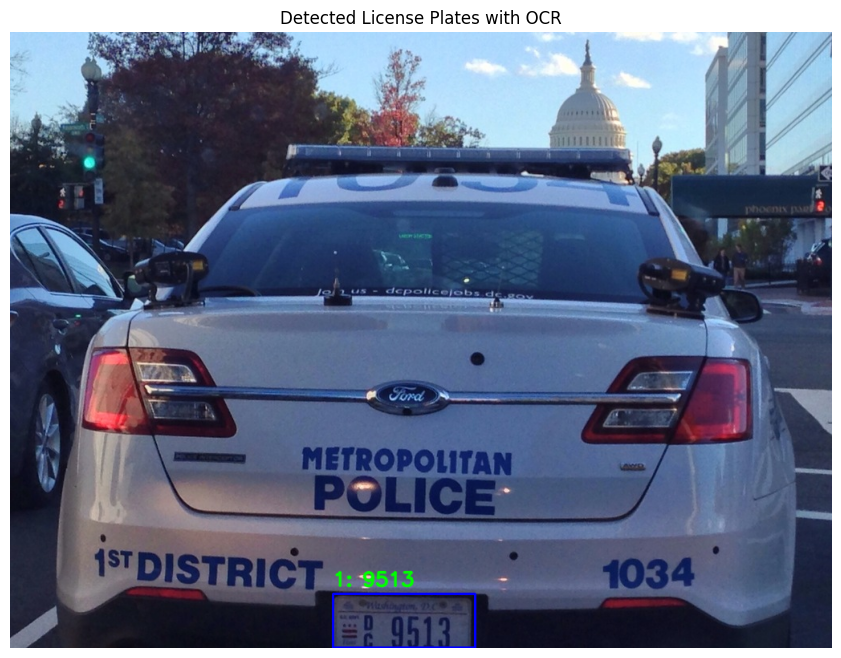

In [126]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import easyocr
from ultralytics import YOLO
import random


model = YOLO('/kaggle/working/runs/detect/train/weights/best.pt')


reader = easyocr.Reader(['en'], gpu=False)

def ocr_best_variant(roi):
    
    
    gray = cv2.cvtColor(roi, cv2.COLOR_BGR2GRAY)
    eq = cv2.equalizeHist(gray)

    thresh = cv2.adaptiveThreshold(
        eq, 255,
        cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
        cv2.THRESH_BINARY,
        blockSize=11, C=2
    )
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3,3))
    closed = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, kernel)

    variants = {
        'orig'  : roi,
        'gray'  : gray,
        'eq'    : eq,
        'thresh': closed
    }

    best_res, best_conf = [], -1
    
    for name, img in variants.items():
        res = reader.readtext(img)
        conf = sum([r[2] for r in res])
        if conf > best_conf:
            best_conf = conf
            best_res = res

    return best_res

def detect_and_read(image_path):
    image = cv2.imread(image_path)
    results = model(image)[0]

    for idx, box in enumerate(results.boxes, start=1):
        x1, y1, x2, y2 = map(int, box.xyxy[0].tolist())
        roi = image[y1:y2, x1:x2]

        
        roi = cv2.resize(roi, None, fx=2, fy=2, interpolation=cv2.INTER_CUBIC)

        
        ocr_res = ocr_best_variant(roi)

       
        plate_text = ' '.join([seg[1] for seg in ocr_res if seg[2] > 0.3]).strip()
        if not plate_text:
            plate_text = "[Unrecognized]"

    
        print(f"Plate {idx}: {plate_text}")

     
        label = f"{idx}: {plate_text}"
        cv2.rectangle(image, (x1, y1), (x2, y2), (255,0,0), 2)
        cv2.putText(
            image, label,
            (x1, y1-10),
            cv2.FONT_HERSHEY_SIMPLEX, 0.8,
            (0,255,0), 2, cv2.LINE_AA
        )

   
    plt.figure(figsize=(12,8))
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title("Detected License Plates with OCR")
    plt.axis('off')
    plt.show()


test_dir = '/kaggle/working/dataset/test/images'
sample = random.choice(os.listdir(test_dir))
detect_and_read(os.path.join(test_dir, sample))

In [131]:
!pip install -q ultralytics easyocr opencv-python-headless

In [132]:
import cv2
import easyocr
import torch
from ultralytics import YOLO
import matplotlib.pyplot as plt


model = YOLO('yolov8n.pt')  


reader = easyocr.Reader(['en'])


def flip_check_ocr(roi):
    original = reader.readtext(roi)
    flipped = reader.readtext(cv2.flip(roi, 1))
    
    original_score = sum([r[2] for r in original])
    flipped_score = sum([r[2] for r in flipped])
    
    return flipped if flipped_score > original_score else original


def detect_and_read(image_path):
    image = cv2.imread(image_path)
    results = model(image)[0]  
    
    for box in results.boxes:
        x1, y1, x2, y2 = map(int, box.xyxy[0].tolist())
        roi = image[y1:y2, x1:x2]
        
       
        roi = cv2.resize(roi, None, fx=2, fy=2, interpolation=cv2.INTER_CUBIC)
        roi_gray = cv2.cvtColor(roi, cv2.COLOR_BGR2GRAY)
        roi_eq = cv2.equalizeHist(roi_gray)
        roi_thresh = cv2.adaptiveThreshold(
            roi_eq, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)
        

        best_text = flip_check_ocr(roi_thresh)
        plate_text = ' '.join([r[1] for r in best_text if r[2] > 0.5])
        
      
        cv2.rectangle(image, (x1, y1), (x2, y2), (255, 0, 0), 2)
        cv2.putText(image, plate_text, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX,
                    0.9, (0, 255, 0), 2)

    plt.figure(figsize=(12, 8))
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title("Detected License Plates with OCR")
    plt.axis('off')
    plt.show()


In [133]:
import cv2
import easyocr
import torch
from ultralytics import YOLO
import matplotlib.pyplot as plt


model = YOLO('yolov8n.pt') 


reader = easyocr.Reader(['en'])


def flip_check_ocr(roi):
    original = reader.readtext(roi)
    flipped = reader.readtext(cv2.flip(roi, 1))
    
    original_score = sum([r[2] for r in original])
    flipped_score = sum([r[2] for r in flipped])
    
    return flipped if flipped_score > original_score else original


def detect_and_read(image_path):
    image = cv2.imread(image_path)
    results = model(image)[0]  
    
    for box in results.boxes:
        x1, y1, x2, y2 = map(int, box.xyxy[0].tolist())
        roi = image[y1:y2, x1:x2]
        
        # Preprocess ROI for better OCR
        roi = cv2.resize(roi, None, fx=2, fy=2, interpolation=cv2.INTER_CUBIC)
        roi_gray = cv2.cvtColor(roi, cv2.COLOR_BGR2GRAY)
        roi_eq = cv2.equalizeHist(roi_gray)
        roi_thresh = cv2.adaptiveThreshold(
            roi_eq, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)
        
        # OCR with flip-check
        best_text = flip_check_ocr(roi_thresh)
        plate_text = ' '.join([r[1] for r in best_text if r[2] > 0.5])
        
        # Draw box and text
        cv2.rectangle(image, (x1, y1), (x2, y2), (255, 0, 0), 2)
        cv2.putText(image, plate_text, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX,
                    0.9, (0, 255, 0), 2)

    plt.figure(figsize=(12, 8))
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title("Detected License Plates with OCR")
    plt.axis('off')
    plt.show()



0: 448x640 1 license_plate, 7.8ms
Speed: 3.0ms preprocess, 7.8ms inference, 2.5ms postprocess per image at shape (1, 3, 448, 640)


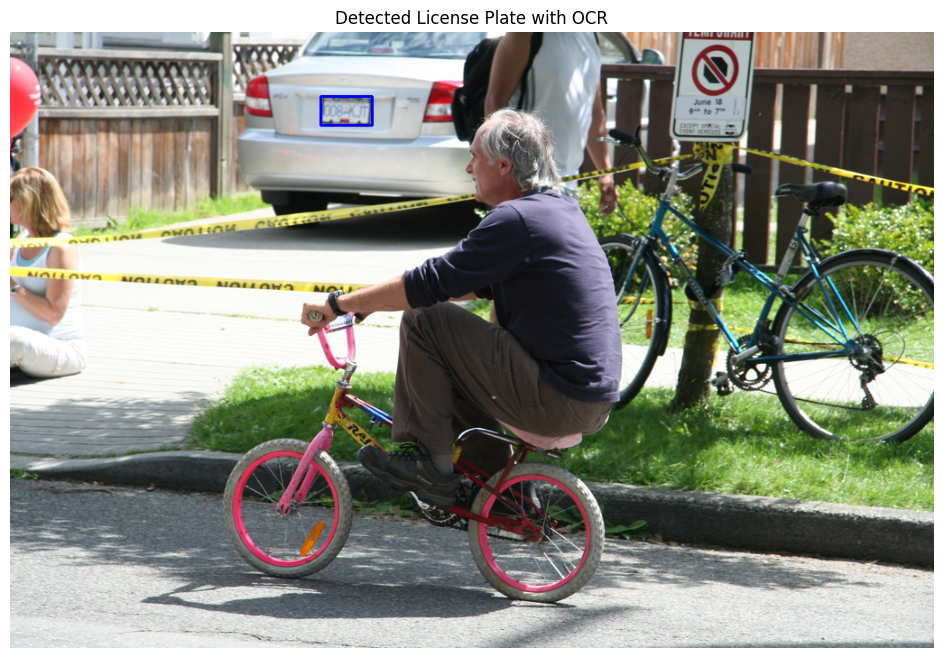

In [159]:
import random

test_dir = '/kaggle/working/dataset/test/images'
test_imgs = os.listdir(test_dir)
sample_img_path = os.path.join(test_dir, random.choice(test_imgs))

detect_and_read(sample_img_path)


In [160]:
image = cv2.imread("/kaggle/input/large-license-plate-dataset/images/test/246a0e4264a39433.jpg")

In [161]:
result = model.predict(image)


0: 480x640 1 license_plate, 11.5ms
Speed: 2.9ms preprocess, 11.5ms inference, 1.6ms postprocess per image at shape (1, 3, 480, 640)


In [141]:
metrics = model.val(data='data.yaml', split='test', conf=0.15, iou=0.3)

Ultralytics 8.3.129 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2245.6±755.7 MB/s, size: 167.5 KB)


val: Scanning /kaggle/working/dataset/test/labels.cache... 386 images, 0 backgrounds, 0 corrupt: 100%|██████████| 386/386 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:04<00:00,  6.24it/s]


                   all        386        512      0.903      0.833      0.897      0.678


/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


Speed: 0.7ms preprocess, 3.0ms inference, 0.0ms loss, 1.6ms postprocess per image
Results saved to runs/detect/val2


In [142]:
metrics.box.map,

(0.6781631695757111,)

In [144]:
import pandas as pd

In [145]:
def batch_detect_and_save_csv(input_folder, output_csv):
    predictions = []

    image_files = [f for f in os.listdir(input_folder) if f.lower().endswith(('.jpg', '.png', '.jpeg'))]

    for img_name in image_files:
        img_path = os.path.join(input_folder, img_name)
        image = cv2.imread(img_path)
        results = model(image)[0]

        plate_texts = []

        for box in results.boxes:
            x1, y1, x2, y2 = map(int, box.xyxy[0].tolist())
            roi = image[y1:y2, x1:x2]

            roi = cv2.resize(roi, None, fx=2, fy=2, interpolation=cv2.INTER_CUBIC)
            roi_gray = cv2.cvtColor(roi, cv2.COLOR_BGR2GRAY)
            roi_eq = cv2.equalizeHist(roi_gray)
            roi_thresh = cv2.adaptiveThreshold(
                roi_eq, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)

            ocr_result = flip_check_ocr(roi_thresh)
            plate_text = ' '.join([r[1] for r in ocr_result if r[2] > 0.5])

            plate_texts.append(plate_text)

        predictions.append({
            'image_name': img_name,
            'num_plates': len(plate_texts),
            'detected_text': '; '.join(plate_texts)
        })

   
    df = pd.DataFrame(predictions)
    df.to_csv(output_csv, index=False)
    print(f"Saved results to {output_csv}")


In [146]:
predicted = model.predict(source='/kaggle/working/dataset/test/images', conf=0.15, iou=0.3, classes=[0])



image 1/386 /kaggle/working/dataset/test/images/003a5aaf6d17c917.jpg: 448x640 1 license_plate, 8.9ms
image 2/386 /kaggle/working/dataset/test/images/00723dac8201a83e.jpg: 480x640 2 license_plates, 7.3ms
image 3/386 /kaggle/working/dataset/test/images/008637722500f239.jpg: 480x640 2 license_plates, 6.4ms
image 4/386 /kaggle/working/dataset/test/images/0170ea8e1a33375a.jpg: 448x640 2 license_plates, 6.7ms
image 5/386 /kaggle/working/dataset/test/images/017527da8bfeb97d.jpg: 448x640 1 license_plate, 6.1ms
image 6/386 /kaggle/working/dataset/test/images/02a6ef3d9bd68e91.jpg: 480x640 2 license_plates, 6.7ms
image 7/386 /kaggle/working/dataset/test/images/03b7b71e1ffcb7a8.jpg: 448x640 1 license_plate, 6.7ms
image 8/386 /kaggle/working/dataset/test/images/044417ca6134604f.jpg: 448x640 1 license_plate, 6.1ms
image 9/386 /kaggle/working/dataset/test/images/057569768fd6303e.jpg: 480x640 2 license_plates, 6.7ms
image 10/386 /kaggle/working/dataset/test/images/064a8def3049d040.jpg: 448x640 1 lice

In [147]:
def add_white_noise(image, mean=0, var=10):
    row, col, ch = image.shape
    sigma = var**0.5
    gauss = np.random.normal(mean, sigma, (row, col, ch)).reshape(row, col, ch)
    noisy = np.clip(image + gauss, 0, 255).astype(np.uint8)
    return noisy

def add_salt_pepper_noise(image, prob=0.01):
    noisy = np.copy(image)
    black = 0
    white = 255
    probs = np.random.rand(*image.shape[:2])
    noisy[probs < prob] = black
    noisy[probs > 1 - prob] = white
    return noisy

def low_pass_filter(image):
    return cv2.GaussianBlur(image, (7, 7), 0)

def high_pass_filter(image):
    kernel = np.array([[0, -1, 0], [-1, 5,-1], [0, -1, 0]])
    return cv2.filter2D(image, -1, kernel)

def sobel_edge(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1)
    sobel = cv2.magnitude(sobelx, sobely)
    return cv2.convertScaleAbs(sobel)

def roberts_edge(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY).astype(np.float32)
    kernelx = np.array([[1, 0], [0, -1]], dtype=np.float32)
    kernely = np.array([[0, 1], [-1, 0]], dtype=np.float32)
    x = cv2.filter2D(gray, -1, kernelx)
    y = cv2.filter2D(gray, -1, kernely)
    roberts = np.sqrt(x**2 + y**2)
    return cv2.convertScaleAbs(roberts)

def canny_edge(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    return cv2.Canny(gray, 100, 200)


In [148]:
def detect_text_and_display(image, title='Original'):
    results = model(image)[0]
    image_copy = image.copy()

    for box in results.boxes:
        x1, y1, x2, y2 = map(int, box.xyxy[0].tolist())
        roi = image[y1:y2, x1:x2]

        roi = cv2.resize(roi, None, fx=2, fy=2, interpolation=cv2.INTER_CUBIC)
        roi_gray = cv2.cvtColor(roi, cv2.COLOR_BGR2GRAY)
        roi_eq = cv2.equalizeHist(roi_gray)
        roi_thresh = cv2.adaptiveThreshold(roi_eq, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                           cv2.THRESH_BINARY, 11, 2)

        ocr_result = flip_check_ocr(roi_thresh)
        plate_text = ' '.join([r[1] for r in ocr_result if r[2] > 0.5])

        cv2.rectangle(image_copy, (x1, y1), (x2, y2), (255, 0, 0), 2)
        cv2.putText(image_copy, plate_text, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX,
                    0.9, (0, 255, 0), 2)

    plt.figure(figsize=(10, 6))
    plt.imshow(cv2.cvtColor(image_copy, cv2.COLOR_BGR2RGB))
    plt.title(title)
    plt.axis('off')
    plt.show()



0: 480x640 1 license_plate, 7.5ms
Speed: 2.6ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 480, 640)


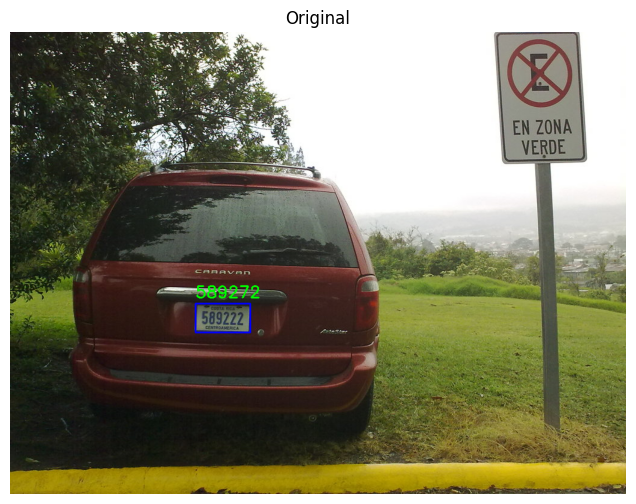


0: 480x640 1 license_plate, 9.5ms
Speed: 3.4ms preprocess, 9.5ms inference, 2.5ms postprocess per image at shape (1, 3, 480, 640)


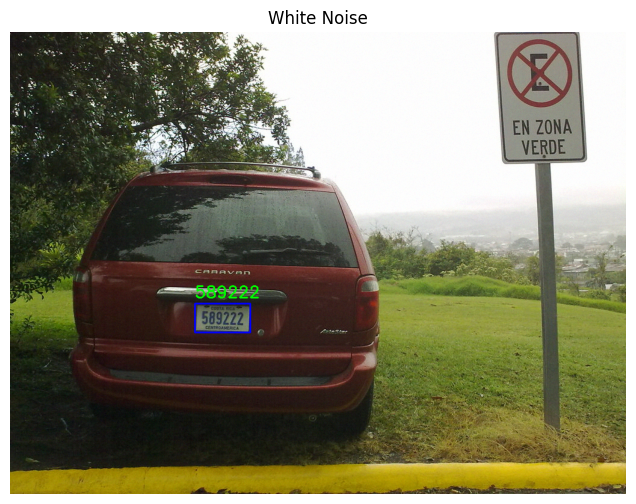


0: 480x640 2 license_plates, 9.8ms
Speed: 3.5ms preprocess, 9.8ms inference, 2.1ms postprocess per image at shape (1, 3, 480, 640)


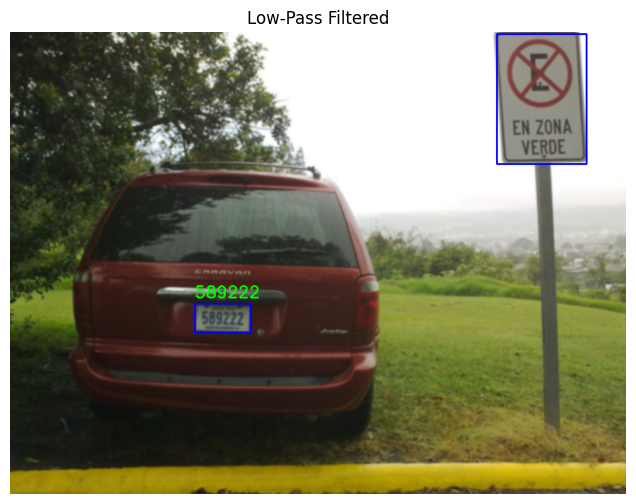


0: 480x640 1 license_plate, 10.5ms
Speed: 3.5ms preprocess, 10.5ms inference, 1.7ms postprocess per image at shape (1, 3, 480, 640)


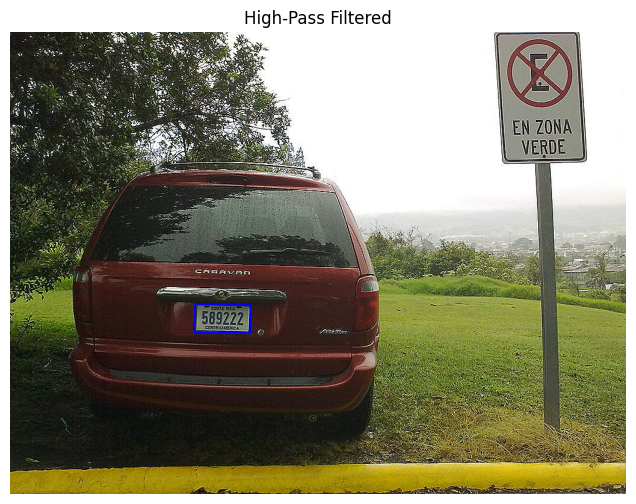


0: 480x640 1 license_plate, 9.8ms
Speed: 3.3ms preprocess, 9.8ms inference, 2.1ms postprocess per image at shape (1, 3, 480, 640)


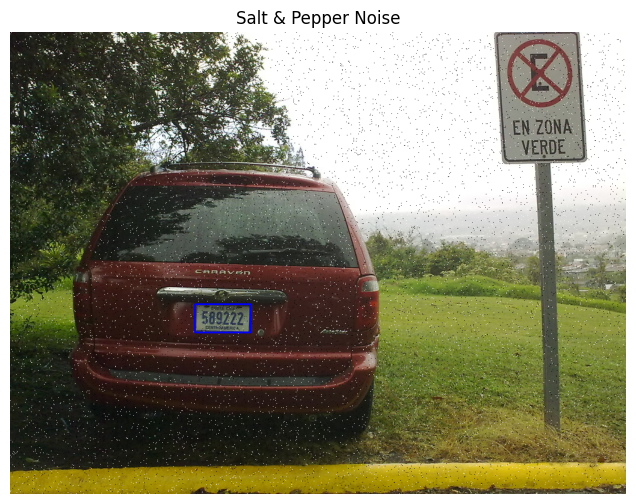


0: 480x640 2 license_plates, 9.5ms
Speed: 3.4ms preprocess, 9.5ms inference, 1.7ms postprocess per image at shape (1, 3, 480, 640)


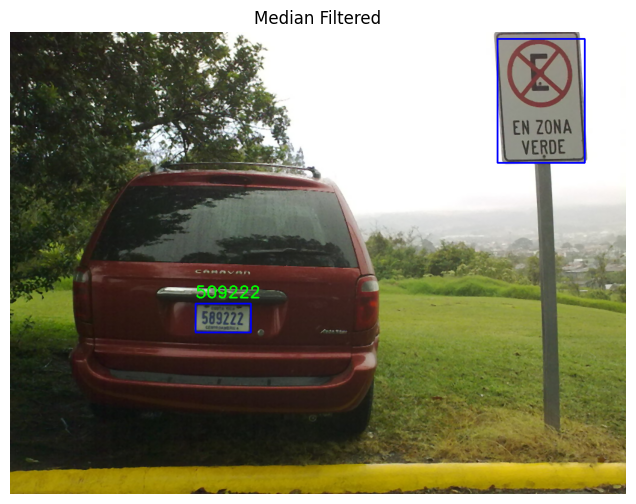

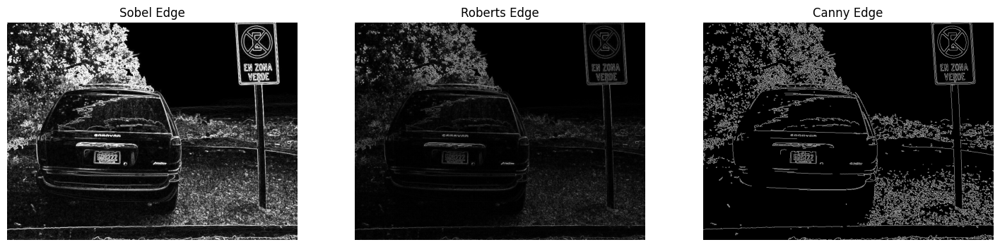

In [149]:
test_img_path = '/kaggle/input/large-license-plate-dataset/images/test/246a0e4264a39433.jpg'  # change if needed
original = cv2.imread(test_img_path)


white_noised = add_white_noise(original)
peppered = add_salt_pepper_noise(original)
low_passed = low_pass_filter(original)
high_passed = high_pass_filter(original)
median_filtered = cv2.medianBlur(peppered, 3)


detect_text_and_display(original, "Original")
detect_text_and_display(white_noised, "White Noise")
detect_text_and_display(low_passed, "Low-Pass Filtered")
detect_text_and_display(high_passed, "High-Pass Filtered")
detect_text_and_display(peppered, "Salt & Pepper Noise")
detect_text_and_display(median_filtered, "Median Filtered")


plt.figure(figsize=(18, 4))
plt.subplot(1, 3, 1); plt.imshow(sobel_edge(original), cmap='gray'); plt.title('Sobel Edge'); plt.axis('off')
plt.subplot(1, 3, 2); plt.imshow(roberts_edge(original), cmap='gray'); plt.title('Roberts Edge'); plt.axis('off')
plt.subplot(1, 3, 3); plt.imshow(canny_edge(original), cmap='gray'); plt.title('Canny Edge'); plt.axis('off')
plt.show()


In [166]:
def add_white_noise(image, mean=0, var=10):
    row, col, ch = image.shape
    sigma = var**0.5
    gauss = np.random.normal(mean, sigma, (row, col, ch)).reshape(row, col, ch)
    noisy = np.clip(image + gauss, 0, 255).astype(np.uint8)
    return noisy

import os, time, random, cv2, torch
import matplotlib.pyplot as plt
from ipywidgets import interact, IntSlider, FloatSlider
from torch import amp

device = 'cuda' if torch.cuda.is_available() else 'cpu'
model.to(device)
if device == 'cuda':
    model.model.half()

TEST_DIR = '/kaggle/working/dataset/test/images'

def annotate_one(blur_kernel: int, conf_thresh: float):

    img_name = random.choice([f for f in os.listdir(TEST_DIR)
                              if f.lower().endswith(('.jpg','.png'))])
    img_path = os.path.join(TEST_DIR, img_name)
    orig = cv2.imread(img_path)
    rgb  = cv2.cvtColor(orig, cv2.COLOR_BGR2RGB)

    start = time.time()
    with amp.autocast(device_type='cuda', enabled=(device=='cuda')):
        results = model(rgb, device=device)[0]
    inf_ms = (time.time() - start) * 1000

    out = orig.copy()
    k = blur_kernel if blur_kernel % 2 == 1 else blur_kernel + 1

    for box in results.boxes:
        x1, y1, x2, y2 = map(int, box.xyxy[0].tolist())
        roi = orig[y1:y2, x1:x2]
        if roi.size == 0: 
            continue

    
        text, conf, _, _ = get_best_ocr_result(preprocess_license_plate(roi), roi)

       
        if conf < conf_thresh:
            out[y1:y2, x1:x2] = cv2.GaussianBlur(roi, (k, k), 0)

        
        color = (0,255,0) if conf >= conf_thresh else (0,165,255)
        cv2.rectangle(out, (x1, y1), (x2, y2), color, 2)
        cv2.putText(out, f"{text} ({conf:.2f})", (x1, y1-10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.8, color, 2)


    cv2.putText(out, f"Time: {inf_ms:.1f}ms", (10, 30),
                cv2.FONT_HERSHEY_SIMPLEX, 1.0, (0,0,255), 2)


    plt.figure(figsize=(10,6))
    plt.imshow(cv2.cvtColor(out, cv2.COLOR_BGR2RGB))
    plt.title(f"{img_name}  —  Blur: {k}×{k}, Thresh: {conf_thresh:.2f}")
    plt.axis('off')
    plt.show()

interact(
    annotate_one,
    blur_kernel=IntSlider(value=5, min=1, max=31, step=2, description='BlurKernel'),
    conf_thresh=FloatSlider(value=0.45, min=0.0, max=1.0, step=0.05, description='ConfThresh')
)

interactive(children=(IntSlider(value=5, description='BlurKernel', max=31, min=1, step=2), FloatSlider(value=0…

<function __main__.annotate_one(blur_kernel: int, conf_thresh: float)>

In [163]:
import os
import time
import cv2
import pandas as pd
import torch
from ultralytics import YOLO

model_path = '/kaggle/working/runs/detect/train/weights/best.pt'
model = YOLO(model_path)
device = 'cuda' if torch.cuda.is_available() else 'cpu'
model.to(device)
if device == 'cuda':
    model.model.half()


test_dir = verify_dataset_paths()
if not test_dir or not os.path.isdir(test_dir):
    raise RuntimeError(f"Test images folder not found: {test_dir}")


def evaluate_folder(folder_path):
    ocr_confs = []
    inf_times = []
    for fname in os.listdir(folder_path):
        if not fname.lower().endswith(('.jpg', '.png')):
            continue

        img_path = os.path.join(folder_path, fname)
        img = cv2.imread(img_path)
        if img is None:
            print(f"  Could not read image {fname}, skipping.")
            continue

     
        t0 = time.time()
        results = model(img)[0]
        inf_times.append((time.time() - t0) * 1000)  # ms

       
        for box in results.boxes:
            try:
                # Safely extract the [x1,y1,x2,y2] coordinates
                coords = box.xyxy.tolist()[0]  # -> [[x1, y1, x2, y2]]
                x1, y1, x2, y2 = map(int, coords)
            except Exception as e:
                # If anything goes wrong here, skip this box
                print(f"    Skipping one box in {fname}: {e}")
                continue

            roi = img[y1:y2, x1:x2]
            if roi.size == 0:
                continue

           
            pre = preprocess_license_plate(roi)
            try:
                _, conf, *_ = get_best_ocr_result(pre, roi)
                ocr_confs.append(conf)
            except Exception as e:
                print(f"  OCR error on {fname}: {e}")
                continue

   
    avg_cra     = sum(ocr_confs) / len(ocr_confs)     if ocr_confs else 0.0
    avg_latency = sum(inf_times) / len(inf_times)     if inf_times else 0.0
    return avg_cra, avg_latency


logs = pd.read_csv('/kaggle/working/runs/detect/train/results.csv')
if logs.empty:
    raise RuntimeError("results.csv is empty or missing metrics")
last = logs.iloc[-1]
detect_metrics = {
    'mAP@0.5':   round(last['metrics/mAP50(B)'], 3),
    'Precision': round(last['metrics/precision(B)'], 3),
    'Recall':    round(last['metrics/recall(B)'], 3),
}


cra, latency = evaluate_folder(test_dir)

df = pd.DataFrame([{
    'Condition':      'All Test Images',
    **detect_metrics,
    'CRA':            round(cra, 3),
    'Latency (GPU)':  f"{latency:.1f} ms"
}])

print(df.to_string(index=False))



0: 448x640 1 license_plate, 6.6ms
Speed: 2.1ms preprocess, 6.6ms inference, 1.4ms postprocess per image at shape (1, 3, 448, 640)
Top OCR candidates: [('HF58HXP', 'HF58HXP', 0.9924006950305446, 'canny_ang2'), ('HF58HXP', 'HF58HXP', 0.9924006950305446, 'canny_ang2'), ('HF58HXP', 'HF58HXP', 0.9565970409280551, 'clahe_ang-2')]

0: 384x640 1 license_plate, 8.0ms
Speed: 2.1ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
Top OCR candidates: [('FZRYV59', 'FZRYV59', 0.6737386082006093, 'otsu_orig_ang2'), ('FZRYV59', 'FZRYV59', 0.6737386082006093, 'otsu_orig_ang2'), ('ZRYV159', 'ZRYV159', 0.5541353046438318, 'otsu_orig_ang-2')]

0: 448x640 1 license_plate, 9.8ms
Speed: 2.7ms preprocess, 9.8ms inference, 1.4ms postprocess per image at shape (1, 3, 448, 640)


KeyboardInterrupt: 